<a href="https://colab.research.google.com/github/tmone/amr-system/blob/main/blood-cell-detector-with-yolo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Blood Cell Recognition using AI: Technical Demonstration**

> 👥 StepMedia Sofware Dev Team



## Project Objectives
1. Demonstrate an automated system for blood cell recognition and classification
2. Showcase the accuracy and efficiency of our AI-powered solution
3. Present real-world applications and benefits in medical diagnostics

## Technical Demo

### 1. Introduction

In [1]:
# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.
import kagglehub
adhoppin_blood_cell_detection_datatset_path = kagglehub.dataset_download('adhoppin/blood-cell-detection-datatset')

print('Data source import complete.')


100%|██████████| 11.8M/11.8M [00:00<00:00, 87.9MB/s]

Extracting files...


Data source import complete.


<div style='background-color: #fff7f7; border: 3px solid Red;'>
    <font size="+1" color="Red">
        <b>Please comment and upvote if you like this work!</b>
    </font>
</div>
<div style='background-color: #fff7f7; border: 3px solid Blue;'>
    <font size="+1" color="Red">
        <b>Take a look at the other notebooks in my profile ->
        <a href="https://www.kaggle.com/killa92/code">  Kaggle Notebooks </a></b>
    </font>
</div>    
<div style='background-color: #fff7f7; border: 3px solid yellow;'>
    <font size="+1" color="Red">
        <b><span style='color: green;'>Let's Support Each Other!!</span></b>
    </font>
</div>

<div style='background-color: #fff7f7; border: 2px solid '>
    <font size="+2" color="blue" ><b>🗂1. Install Libraries and Download a pre-trained checkpoints 🗂️</b></font>
</div>

In [2]:
!pip install ultralytics
from ultralytics import YOLO
model = YOLO("yolo11n.pt")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 914.8/914.8 kB 15.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 78.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 80.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 48.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 9.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 36.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 15.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 78.8 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstal

100%|██████████| 5.35M/5.35M [00:00<00:00, 64.4MB/s]


 <div style='background-color: #fff7f7; border: 2px solid '>
    <font size="+2" color="blue" ><b>📈 2.Data Preparation and  Data Analysis 📈</b></font>
</div>

In [3]:
from glob import glob
import os

HOME = "/kaggle/working"
def make_ds(root, path_to_copy):

    os.makedirs(path_to_copy, exist_ok = True)

    files = glob(f"{root}/*")
    for idx, file in enumerate(files):
        if os.path.isdir(file): os.system(f"cp -r '{file}' {path_to_copy}")
        elif os.path.isfile(file): os.system(f"cp '{file}' {path_to_copy}")

root = "/kaggle/input/blood-cell-detection-datatset"
make_ds(root = root, path_to_copy = f"{HOME}/datasets")

Data analysis is in process...

Data analysis is in process...

Data analysis is in process...



<ipython-input-4-d3083e6ccda0>:105: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(cls_names)
<ipython-input-4-d3083e6ccda0>:105: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(cls_names)
<ipython-input-4-d3083e6ccda0>:105: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(cls_names)


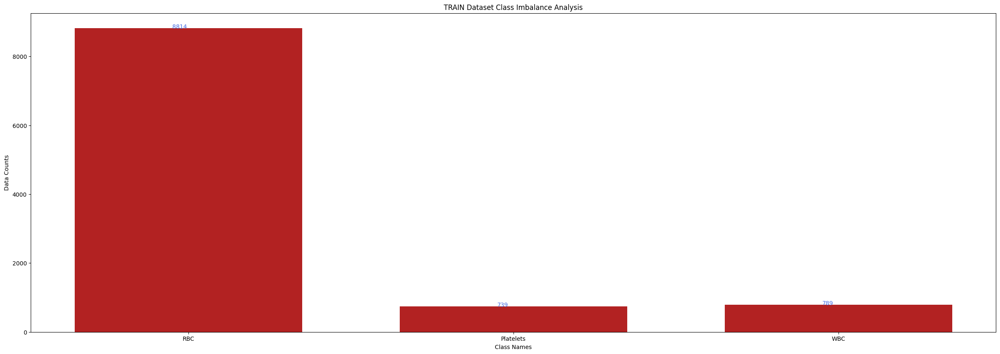

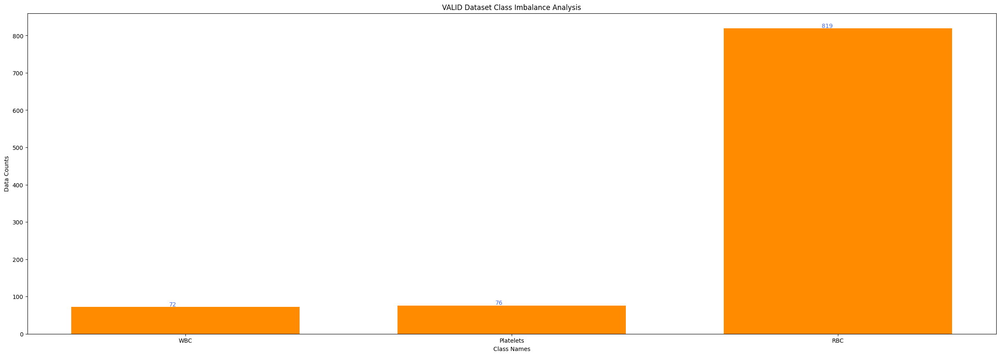

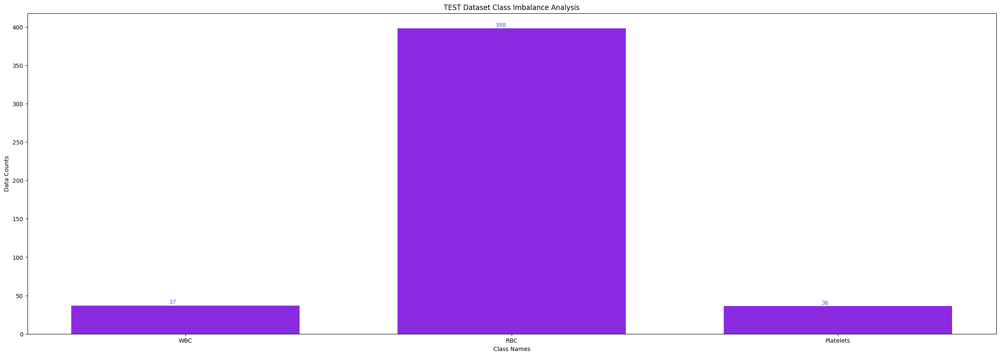

In [4]:
import cv2, yaml, random, numpy as np
from PIL import Image
from matplotlib import pyplot as plt
from torchvision import transforms as T

class Visualization:

    def __init__(self, data_types, n_ims, rows, cmap = None):

        self.n_ims, self.rows = n_ims, rows
        self.cmap, self.data_types  = cmap, data_types
        self.colors = ["firebrick", "darkorange", "blueviolet"]

        self.get_cls_names(); self.get_bboxes()

    def get_cls_names(self):

        with open(f"{adhoppin_blood_cell_detection_datatset_path}/data.yaml", 'r') as file: data = yaml.safe_load(file)
        # Extract class names
        class_names = data['names']

        # Create a dictionary with index as key and class name as value
        self.class_dict = {index: name for index, name in enumerate(class_names)}

    def get_bboxes(self):

        self.vis_datas, self.analysis_datas, self.im_paths = {}, {}, {}
        for data_type in self.data_types:
            all_bboxes, all_analysis_datas = [], {}
            im_paths = glob(f"{adhoppin_blood_cell_detection_datatset_path}/{data_type}/images/*")
            for idx, im_path in enumerate(im_paths):
                bboxes = []
                # if idx == 3: break
                lbl_path  = im_path.replace("images", "labels").replace(".jpg", ".txt")
                meta_data = open(lbl_path).readlines()
                for data in meta_data:
                    # Split the string by space and strip the newline character
                    # Change here
                    parts = data.strip().split()[:5]
                    cls_name = self.class_dict[int(parts[0])]
                    # Convert first element to integer and the rest to float
                    bboxes.append([cls_name] + [float(x) for x in parts[1:]])
                    if cls_name not in all_analysis_datas: all_analysis_datas[cls_name] = 1
                    else: all_analysis_datas[cls_name] += 1
                all_bboxes.append(bboxes)

            self.vis_datas[data_type] = all_bboxes; self.analysis_datas[data_type] = all_analysis_datas; self.im_paths[data_type] = im_paths

    def plot(self, rows, cols, count, im_path, bboxes):

        plt.subplot(rows, cols, count)
        or_im = np.array(Image.open(im_path).convert("RGB"))
        height, width, _ = or_im.shape

        for bbox in bboxes:

            class_id, x_center, y_center, w, h = bbox

            # Convert YOLO format to pixel values
            x_min = int((x_center - w / 2) * width)  # x_min
            y_min = int((y_center - h / 2) * height)  # y_min
            x_max = int((x_center + w / 2) * width)  # x_max
            y_max = int((y_center + h / 2) * height)  # y_max

            color = (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))
            cv2.rectangle(img = or_im, pt1 = (x_min, y_min), pt2 = (x_max, y_max), color = color, thickness = 3)
        plt.imshow(or_im)
        plt.axis("off"); plt.title(f"There are {len(bboxes)} objects in the image.")

        return count + 1

    def vis(self, save_name):

        print(f"{save_name.upper()} Data Visualization is in process...\n")
        assert self.cmap in ["rgb", "gray"], "Please choose rgb or gray cmap"
        if self.cmap == "rgb": cmap = "viridis"
        cols = self.n_ims // self.rows; count = 1

        plt.figure(figsize = (25, 20))

        indices = [random.randint(a = 0, b = len(self.vis_datas[save_name]) - 1) for _ in range(self.n_ims)]

        for idx, index in enumerate(indices):

            if count == self.n_ims + 1: break

            im_path, bboxes = self.im_paths[save_name][index], self.vis_datas[save_name][index]

            count = self.plot(self.rows, cols, count, im_path = im_path, bboxes = bboxes)

        plt.show()

    def data_analysis(self, save_name, color):

        print("Data analysis is in process...\n")

        width, text_width, text_height = 0.7, 0.05, 2
        cls_names = list(self.analysis_datas[save_name].keys()); counts = list(self.analysis_datas[save_name].values())

        _, ax = plt.subplots(figsize = (30, 10))
        indices = np.arange(len(counts))

        ax.bar(indices, counts, width, color = color)
        ax.set_xlabel("Class Names", color = "black")
        ax.set_xticklabels(cls_names)
        ax.set(xticks = indices, xticklabels = cls_names)
        ax.set_ylabel("Data Counts", color = "black")
        ax.set_title(f"{save_name.upper()} Dataset Class Imbalance Analysis")

        for i, v in enumerate(counts): ax.text(i - text_width, v + text_height, str(v), color = "royalblue")

    def visualization(self): [self.vis(save_name) for save_name in self.data_types]

    def analysis(self): [self.data_analysis(save_name, color) for (save_name, color) in zip(self.data_types, self.colors)]

vis = Visualization(data_types = ["train", "valid", "test"], n_ims = 20, rows = 5, cmap = "rgb")
vis.analysis()

<div style='background-color: #fff7f7; border: 2px solid '>
    <font size="+2" color="blue" ><b>📊 3. Data Visualization 📊</b></font>
</div>

TRAIN Data Visualization is in process...



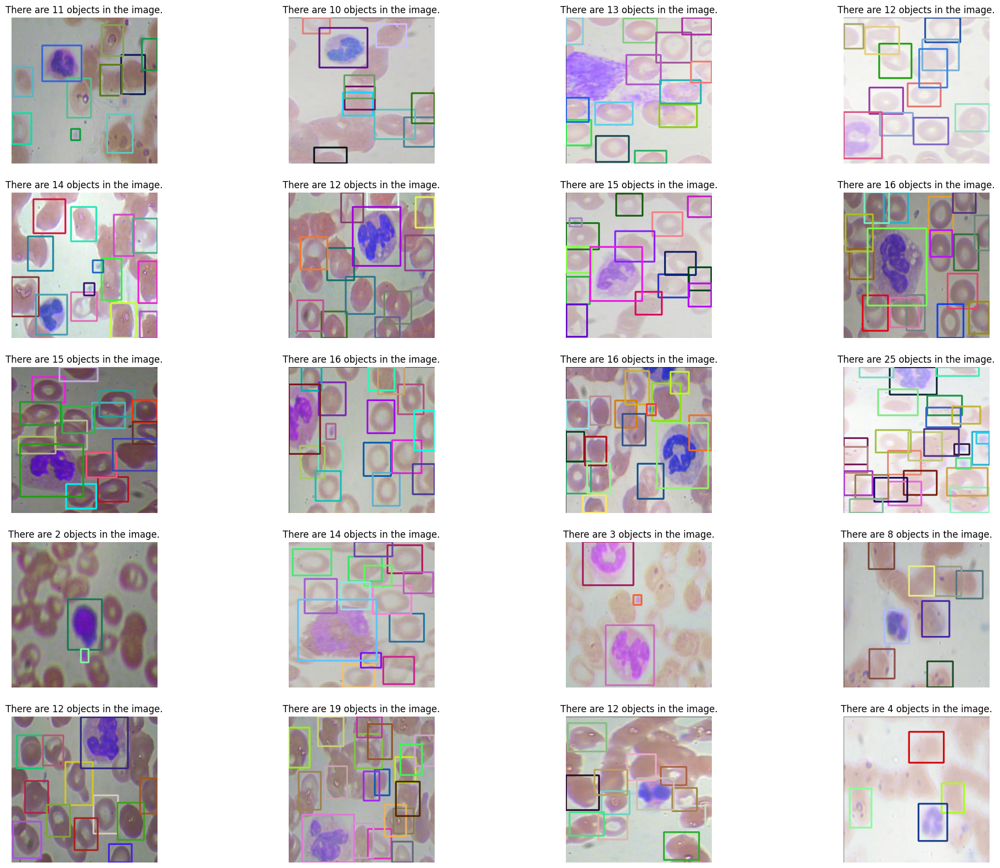

VALID Data Visualization is in process...



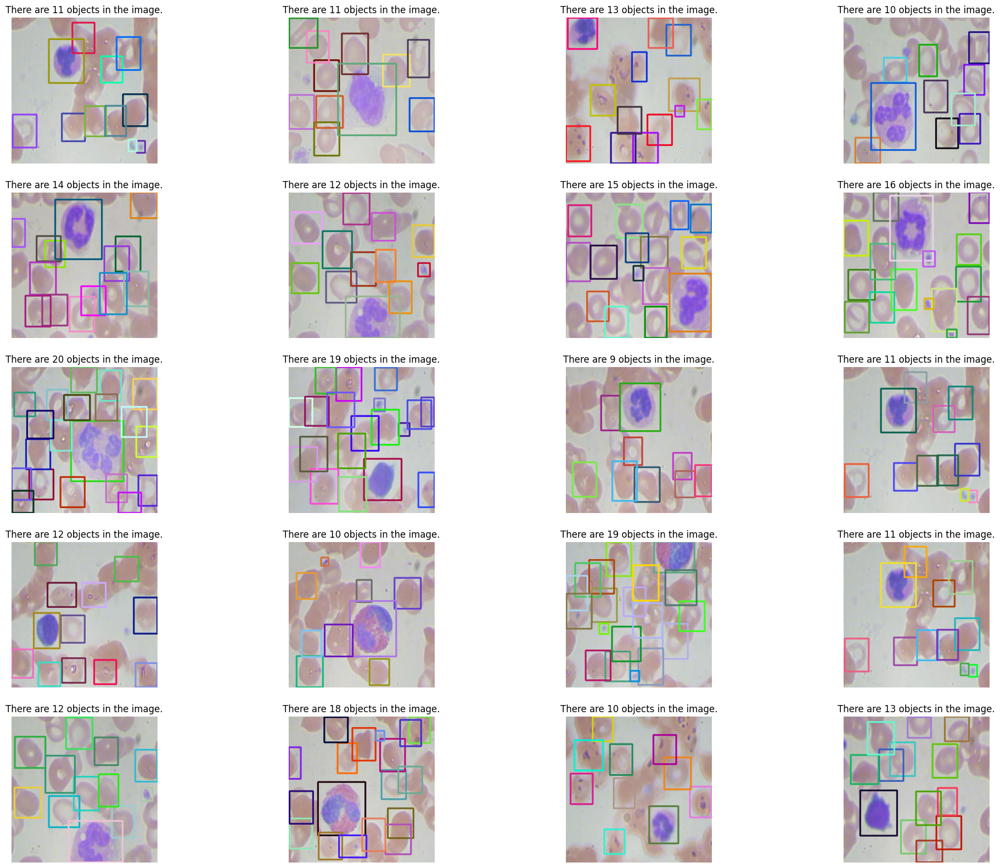

TEST Data Visualization is in process...



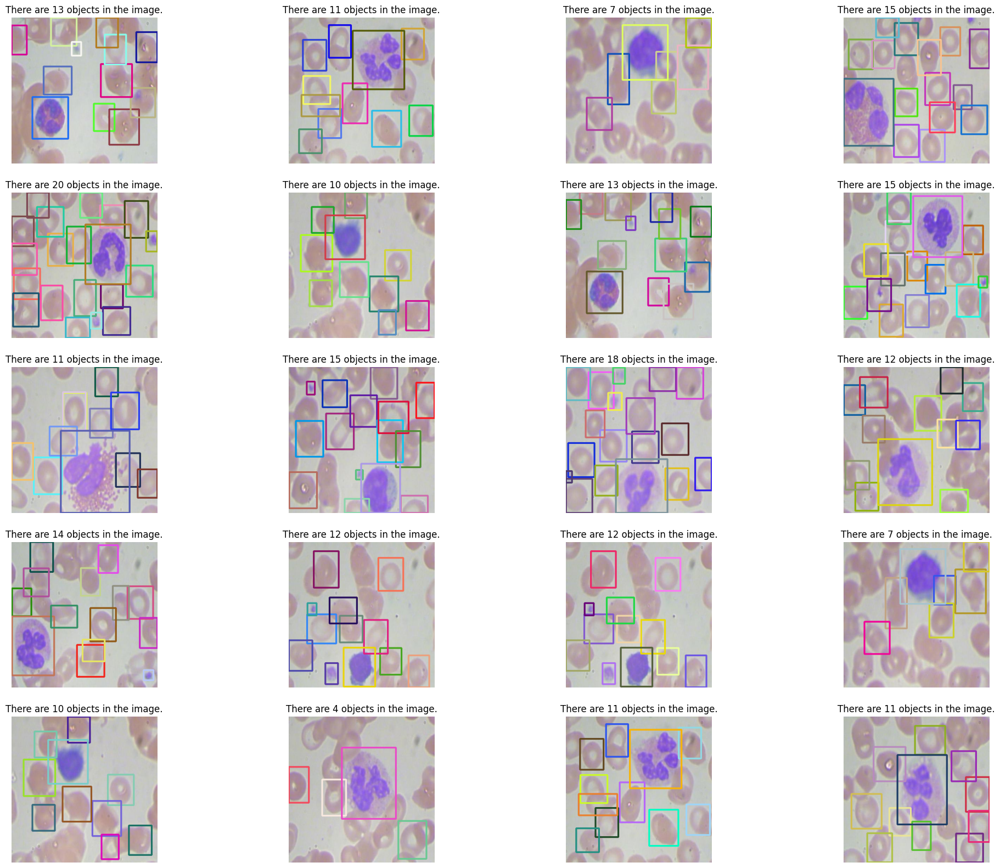

In [5]:
vis.visualization()

<div style='background-color: #fff7f7; border: 2px solid '>
    <font size="+2" color="blue" ><b>✨ 4. AI Model Train and Validation ✨</b></font>
</div>

In [15]:
train_results = model.train(
    data=f"{adhoppin_blood_cell_detection_datatset_path}/data.yaml",  # path to dataset YAML
    epochs=100,  # number of training epochs
    imgsz=480,  # training image size
    device=0,  # device to run on, i.e. device=0 or device=0,1,2,3 or device=cpu
)

Ultralytics 8.3.72 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=/root/.cache/kagglehub/datasets/adhoppin/blood-cell-detection-datatset/versions/1036/data.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=480, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False

train: Scanning /root/.cache/kagglehub/datasets/adhoppin/blood-cell-detection-datatset/versions/1036/train/labels.cache... 765 images, 0 backgrounds, 0 corrupt: 100%|██████████| 765/765 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /root/.cache/kagglehub/datasets/adhoppin/blood-cell-detection-datatset/versions/1036/valid/labels.cache... 73 images, 0 backgrounds, 0 corrupt: 100%|██████████| 73/73 [00:00<?, ?it/s]


Plotting labels to runs/detect/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 480 train, 480 val
Using 8 dataloader workers
Logging results to runs/detect/train2
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      1.63G      1.847      1.637      1.818        263        480: 100%|██████████| 48/48 [00:06<00:00,  7.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.18it/s]

                   all         73        967      0.779      0.693       0.77      0.493



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100       1.6G      1.355      1.095      1.455        263        480: 100%|██████████| 48/48 [00:05<00:00,  8.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.42it/s]

                   all         73        967      0.796      0.931      0.888      0.592



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      1.53G      1.277       1.02      1.369        203        480: 100%|██████████| 48/48 [00:05<00:00,  9.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.40it/s]

                   all         73        967      0.825      0.901      0.886      0.604



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      1.52G      1.253          1      1.337        324        480: 100%|██████████| 48/48 [00:05<00:00,  9.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.40it/s]

                   all         73        967      0.802      0.918      0.887      0.618



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      1.55G      1.212     0.9616      1.313        277        480: 100%|██████████| 48/48 [00:05<00:00,  9.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.98it/s]

                   all         73        967      0.811       0.91      0.872      0.597



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      1.56G      1.212     0.9533      1.309        277        480: 100%|██████████| 48/48 [00:04<00:00,  9.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.42it/s]

                   all         73        967       0.79      0.926      0.878       0.61



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      1.57G      1.183     0.9332      1.281        305        480: 100%|██████████| 48/48 [00:05<00:00,  9.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.10it/s]

                   all         73        967       0.83      0.908      0.901      0.599



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      1.57G      1.158     0.9113      1.268        234        480: 100%|██████████| 48/48 [00:05<00:00,  9.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.34it/s]

                   all         73        967      0.827      0.921      0.909       0.63



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100       1.6G      1.168      0.895      1.266        223        480: 100%|██████████| 48/48 [00:05<00:00,  9.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.32it/s]

                   all         73        967       0.83      0.914      0.907      0.632



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      1.53G      1.159      0.889      1.259        302        480: 100%|██████████| 48/48 [00:05<00:00,  9.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.59it/s]

                   all         73        967      0.834      0.909      0.901      0.616



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      1.54G      1.145     0.8795      1.251        226        480: 100%|██████████| 48/48 [00:05<00:00,  9.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.73it/s]

                   all         73        967      0.856      0.877      0.902      0.629



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      1.58G      1.147     0.8833      1.251        278        480: 100%|██████████| 48/48 [00:05<00:00,  9.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.87it/s]

                   all         73        967      0.803      0.922      0.902      0.622



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      1.51G      1.138     0.8713      1.236        264        480: 100%|██████████| 48/48 [00:05<00:00,  9.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.84it/s]

                   all         73        967      0.826      0.911      0.908      0.625



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      1.55G      1.127     0.8568      1.227        219        480: 100%|██████████| 48/48 [00:05<00:00,  9.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.62it/s]

                   all         73        967      0.836       0.92      0.914      0.633



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      1.52G      1.147     0.8583      1.242        287        480: 100%|██████████| 48/48 [00:05<00:00,  9.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.70it/s]

                   all         73        967      0.846      0.911      0.914      0.642



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      1.55G      1.147     0.8586      1.236        245        480: 100%|██████████| 48/48 [00:04<00:00,  9.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.69it/s]

                   all         73        967      0.826       0.91      0.905      0.634



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      1.55G      1.128     0.8493      1.223        312        480: 100%|██████████| 48/48 [00:05<00:00,  9.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.47it/s]

                   all         73        967      0.808       0.91      0.888      0.628



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      1.55G      1.125     0.8319      1.217        300        480: 100%|██████████| 48/48 [00:05<00:00,  9.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.80it/s]

                   all         73        967      0.827      0.866        0.9      0.623



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      1.56G      1.119     0.8302      1.213        171        480: 100%|██████████| 48/48 [00:05<00:00,  9.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.93it/s]

                   all         73        967      0.825      0.941      0.922      0.645



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      1.53G      1.122     0.8394      1.218        270        480: 100%|██████████| 48/48 [00:05<00:00,  8.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.90it/s]

                   all         73        967      0.827      0.946      0.921      0.647



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      1.53G      1.115     0.8162      1.204        312        480: 100%|██████████| 48/48 [00:05<00:00,  9.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.79it/s]

                   all         73        967      0.855      0.881      0.918      0.644



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      1.55G       1.11     0.8159      1.201        302        480: 100%|██████████| 48/48 [00:04<00:00,  9.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.88it/s]

                   all         73        967      0.838      0.905      0.905      0.627



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      1.57G      1.107     0.8162      1.205        315        480: 100%|██████████| 48/48 [00:05<00:00,  9.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  9.04it/s]


                   all         73        967      0.845      0.915      0.914      0.636

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      1.55G      1.101      0.798      1.195        306        480: 100%|██████████| 48/48 [00:05<00:00,  9.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.66it/s]


                   all         73        967      0.838      0.905      0.916      0.641

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      1.64G      1.088     0.8083      1.194        275        480: 100%|██████████| 48/48 [00:05<00:00,  9.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.91it/s]

                   all         73        967      0.852      0.895      0.917      0.639



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      1.54G      1.095     0.8008      1.196        187        480: 100%|██████████| 48/48 [00:05<00:00,  8.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.83it/s]

                   all         73        967       0.82      0.932      0.903      0.628



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      1.54G      1.093     0.8011      1.198        340        480: 100%|██████████| 48/48 [00:05<00:00,  9.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.30it/s]

                   all         73        967      0.829      0.926      0.926      0.654



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      1.56G      1.102     0.8068      1.196        278        480: 100%|██████████| 48/48 [00:05<00:00,  9.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  9.01it/s]


                   all         73        967      0.826      0.909      0.917      0.646

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      1.55G      1.084     0.7915      1.187        279        480: 100%|██████████| 48/48 [00:05<00:00,  9.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.76it/s]


                   all         73        967      0.835      0.904      0.905      0.628

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      1.54G      1.077     0.7874      1.181        257        480: 100%|██████████| 48/48 [00:05<00:00,  9.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.58it/s]

                   all         73        967      0.818      0.931      0.907      0.639



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      1.57G      1.076     0.7833      1.182        229        480: 100%|██████████| 48/48 [00:05<00:00,  9.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  9.27it/s]

                   all         73        967      0.837      0.914      0.914      0.656



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      1.53G      1.067     0.7743      1.167        295        480: 100%|██████████| 48/48 [00:05<00:00,  8.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.54it/s]

                   all         73        967       0.86      0.896      0.918      0.649



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      1.56G      1.074     0.7907       1.18        245        480: 100%|██████████| 48/48 [00:05<00:00,  9.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  9.06it/s]


                   all         73        967      0.867      0.885      0.922      0.647

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      1.54G       1.07     0.7653      1.173        282        480: 100%|██████████| 48/48 [00:05<00:00,  9.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.87it/s]

                   all         73        967      0.855      0.916      0.927      0.663



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      1.57G      1.075     0.7784      1.182        234        480: 100%|██████████| 48/48 [00:05<00:00,  8.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.08it/s]

                   all         73        967      0.855      0.906      0.922      0.646



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      1.53G      1.067      0.766      1.175        214        480: 100%|██████████| 48/48 [00:05<00:00,  9.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.85it/s]

                   all         73        967      0.842      0.915       0.93      0.655



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      1.54G      1.066     0.7628      1.168        280        480: 100%|██████████| 48/48 [00:05<00:00,  9.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  9.18it/s]


                   all         73        967      0.855      0.899      0.922      0.649

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      1.52G      1.067     0.7694      1.166        228        480: 100%|██████████| 48/48 [00:05<00:00,  9.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.39it/s]

                   all         73        967      0.833      0.913      0.919       0.65



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      1.56G      1.045     0.7447      1.155        290        480: 100%|██████████| 48/48 [00:05<00:00,  9.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.88it/s]

                   all         73        967      0.831      0.928      0.917      0.648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100       1.6G      1.056       0.76      1.162        330        480: 100%|██████████| 48/48 [00:05<00:00,  9.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.72it/s]

                   all         73        967       0.84      0.919      0.918       0.65



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      1.53G      1.056     0.7534      1.165        277        480: 100%|██████████| 48/48 [00:05<00:00,  9.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  9.07it/s]


                   all         73        967      0.822      0.882       0.91       0.65

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      1.53G      1.052     0.7449      1.161        284        480: 100%|██████████| 48/48 [00:05<00:00,  9.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  9.11it/s]


                   all         73        967      0.814       0.94      0.915      0.648

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      1.54G      1.055     0.7523      1.166        212        480: 100%|██████████| 48/48 [00:04<00:00,  9.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.95it/s]


                   all         73        967      0.817      0.923      0.917      0.646

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      1.55G      1.042     0.7423      1.155        319        480: 100%|██████████| 48/48 [00:05<00:00,  9.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.97it/s]

                   all         73        967      0.821      0.926      0.917      0.646



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      1.53G      1.056     0.7356       1.16        303        480: 100%|██████████| 48/48 [00:05<00:00,  9.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  9.05it/s]


                   all         73        967      0.821      0.929      0.914      0.649

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      1.55G      1.046     0.7393      1.156        288        480: 100%|██████████| 48/48 [00:05<00:00,  9.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  9.10it/s]

                   all         73        967      0.836      0.902      0.915      0.652



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      1.57G      1.053      0.738      1.157        284        480: 100%|██████████| 48/48 [00:05<00:00,  9.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.85it/s]


                   all         73        967      0.836      0.904      0.924      0.652

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      1.63G      1.041     0.7333      1.149        256        480: 100%|██████████| 48/48 [00:05<00:00,  9.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.94it/s]


                   all         73        967      0.821      0.936      0.925      0.648

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      1.57G      1.035      0.729      1.142        320        480: 100%|██████████| 48/48 [00:04<00:00,  9.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.95it/s]


                   all         73        967      0.826      0.906      0.912      0.655

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      1.54G      1.045     0.7372      1.149        293        480: 100%|██████████| 48/48 [00:05<00:00,  9.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.35it/s]

                   all         73        967      0.806      0.928      0.904      0.645



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      1.58G       1.04     0.7387      1.149        263        480: 100%|██████████| 48/48 [00:05<00:00,  8.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.72it/s]

                   all         73        967      0.796      0.929      0.906      0.642



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      1.54G       1.04     0.7373       1.15        222        480: 100%|██████████| 48/48 [00:05<00:00,  9.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  9.22it/s]


                   all         73        967      0.797      0.938      0.904      0.636

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      1.58G      1.013     0.7168      1.129        308        480: 100%|██████████| 48/48 [00:05<00:00,  9.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.73it/s]


                   all         73        967      0.829      0.911      0.919      0.647

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      1.58G       1.04     0.7289      1.149        261        480: 100%|██████████| 48/48 [00:05<00:00,  9.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.38it/s]

                   all         73        967      0.827      0.915      0.908      0.642



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      1.56G      1.032     0.7184      1.145        313        480: 100%|██████████| 48/48 [00:05<00:00,  9.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.91it/s]


                   all         73        967       0.83      0.909      0.911      0.641

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      1.63G      1.024     0.7193      1.146        297        480: 100%|██████████| 48/48 [00:04<00:00,  9.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.41it/s]

                   all         73        967      0.848      0.884      0.913      0.645



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      1.52G      1.034     0.7181       1.14        224        480: 100%|██████████| 48/48 [00:05<00:00,  8.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.11it/s]

                   all         73        967      0.808       0.92      0.909       0.64



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      1.53G       1.01     0.7113      1.132        196        480: 100%|██████████| 48/48 [00:05<00:00,  9.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  9.18it/s]

                   all         73        967      0.841      0.888      0.905      0.644



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      1.61G      1.025     0.7132      1.141        323        480: 100%|██████████| 48/48 [00:05<00:00,  9.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.21it/s]

                   all         73        967       0.81        0.9        0.9      0.633



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      1.56G       1.03     0.7257      1.144        251        480: 100%|██████████| 48/48 [00:05<00:00,  8.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.67it/s]

                   all         73        967      0.825      0.894      0.908      0.645



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      1.53G      1.026     0.7161      1.136        292        480: 100%|██████████| 48/48 [00:05<00:00,  9.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.82it/s]

                   all         73        967      0.786      0.942      0.902      0.642



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      1.58G      1.019     0.7057      1.132        210        480: 100%|██████████| 48/48 [00:05<00:00,  9.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  9.03it/s]


                   all         73        967      0.818      0.909      0.904      0.639

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      1.52G      1.018     0.7105      1.137        278        480: 100%|██████████| 48/48 [00:05<00:00,  9.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.94it/s]


                   all         73        967      0.827      0.909      0.905      0.645

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      1.55G     0.9995     0.6955      1.125        195        480: 100%|██████████| 48/48 [00:05<00:00,  9.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.72it/s]

                   all         73        967      0.805      0.912      0.904      0.638



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      1.59G      1.011     0.6967      1.124        259        480: 100%|██████████| 48/48 [00:04<00:00,  9.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.79it/s]

                   all         73        967      0.827      0.896       0.91      0.648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      1.54G      1.011     0.7053      1.133        217        480: 100%|██████████| 48/48 [00:05<00:00,  9.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.87it/s]

                   all         73        967      0.821      0.895      0.903       0.65



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      1.54G      1.021     0.7025      1.133        337        480: 100%|██████████| 48/48 [00:05<00:00,  9.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.36it/s]

                   all         73        967      0.819      0.911      0.913      0.639



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      1.56G      1.016     0.7029      1.134        350        480: 100%|██████████| 48/48 [00:04<00:00,  9.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.74it/s]

                   all         73        967      0.819      0.898      0.904      0.641



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      1.55G      1.003     0.6857      1.124        274        480: 100%|██████████| 48/48 [00:05<00:00,  9.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.79it/s]

                   all         73        967      0.816      0.898      0.903       0.64



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      1.59G      1.004     0.6819      1.126        302        480: 100%|██████████| 48/48 [00:05<00:00,  9.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.60it/s]

                   all         73        967      0.833      0.886      0.906      0.644



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      1.56G      1.004     0.6894      1.128        279        480: 100%|██████████| 48/48 [00:05<00:00,  9.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.34it/s]

                   all         73        967      0.839      0.898      0.907      0.648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      1.57G     0.9949     0.6841      1.124        179        480: 100%|██████████| 48/48 [00:05<00:00,  8.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.71it/s]

                   all         73        967      0.814      0.911      0.907      0.647



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      1.53G      1.001     0.6874      1.125        345        480: 100%|██████████| 48/48 [00:05<00:00,  9.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.98it/s]

                   all         73        967      0.846      0.893       0.91      0.653



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      1.53G      1.002     0.6885      1.129        317        480: 100%|██████████| 48/48 [00:05<00:00,  9.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.94it/s]


                   all         73        967      0.816      0.901      0.903      0.649

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      1.51G     0.9997     0.6906       1.12        238        480: 100%|██████████| 48/48 [00:05<00:00,  9.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  9.02it/s]


                   all         73        967      0.845      0.884      0.908       0.65

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      1.57G      1.003     0.6788      1.127        335        480: 100%|██████████| 48/48 [00:05<00:00,  9.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  9.01it/s]

                   all         73        967      0.793      0.926      0.908      0.643



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      1.56G     0.9935     0.6769      1.114        279        480: 100%|██████████| 48/48 [00:05<00:00,  9.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.87it/s]


                   all         73        967      0.851      0.879      0.912      0.652

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      1.61G     0.9934     0.6766       1.12        229        480: 100%|██████████| 48/48 [00:05<00:00,  9.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.42it/s]

                   all         73        967      0.843      0.892      0.908      0.648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      1.54G     0.9819     0.6699      1.112        177        480: 100%|██████████| 48/48 [00:05<00:00,  9.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.67it/s]


                   all         73        967      0.811      0.905      0.906      0.646

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      1.55G     0.9904     0.6778      1.113        279        480: 100%|██████████| 48/48 [00:05<00:00,  9.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  9.02it/s]


                   all         73        967      0.825       0.89      0.905       0.64

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      1.54G     0.9978     0.6856      1.119        292        480: 100%|██████████| 48/48 [00:05<00:00,  9.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.60it/s]

                   all         73        967      0.812      0.908      0.906      0.641



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      1.55G     0.9832     0.6732      1.111        301        480: 100%|██████████| 48/48 [00:05<00:00,  9.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.99it/s]

                   all         73        967      0.833      0.895      0.909      0.648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      1.55G     0.9852     0.6728      1.111        228        480: 100%|██████████| 48/48 [00:05<00:00,  9.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.66it/s]


                   all         73        967      0.817      0.908      0.905      0.645

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      1.55G     0.9778     0.6676      1.112        281        480: 100%|██████████| 48/48 [00:05<00:00,  9.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.82it/s]

                   all         73        967      0.821      0.907      0.906      0.647



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      1.56G     0.9794      0.679      1.113        227        480: 100%|██████████| 48/48 [00:05<00:00,  9.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.50it/s]

                   all         73        967      0.823      0.903      0.902      0.643



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      1.51G     0.9782     0.6641      1.115        272        480: 100%|██████████| 48/48 [00:05<00:00,  9.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  9.05it/s]


                   all         73        967      0.818      0.902        0.9      0.638

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      1.54G     0.9826     0.6615      1.111        221        480: 100%|██████████| 48/48 [00:05<00:00,  9.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.82it/s]


                   all         73        967      0.831      0.879      0.903      0.642

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      1.54G     0.9701     0.6613      1.107        286        480: 100%|██████████| 48/48 [00:05<00:00,  8.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.38it/s]

                   all         73        967      0.817      0.905      0.904      0.644



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      1.56G     0.9689     0.6694      1.109        254        480: 100%|██████████| 48/48 [00:05<00:00,  9.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.90it/s]


                   all         73        967       0.82      0.894      0.904      0.638

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      1.52G     0.9745     0.6639       1.11        239        480: 100%|██████████| 48/48 [00:04<00:00,  9.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.91it/s]

                   all         73        967      0.821      0.906      0.902      0.642


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      1.43G     0.9576     0.6375      1.101        200        480: 100%|██████████| 48/48 [00:05<00:00,  8.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.01it/s]

                   all         73        967      0.803      0.917      0.903      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      1.47G       0.95     0.6146      1.099        157        480: 100%|██████████| 48/48 [00:04<00:00,  9.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.81it/s]


                   all         73        967      0.815      0.907      0.906      0.642

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      1.48G     0.9489      0.616      1.104        159        480: 100%|██████████| 48/48 [00:05<00:00,  9.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.57it/s]

                   all         73        967      0.838      0.901      0.907      0.638



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      1.43G     0.9383     0.6009      1.098        166        480: 100%|██████████| 48/48 [00:05<00:00,  8.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.51it/s]

                   all         73        967      0.825      0.909      0.906       0.64



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      1.47G     0.9358     0.6004      1.094        180        480: 100%|██████████| 48/48 [00:05<00:00,  9.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.72it/s]

                   all         73        967      0.823      0.909      0.905       0.64



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      1.47G     0.9448     0.6014      1.098        147        480: 100%|██████████| 48/48 [00:05<00:00,  9.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.91it/s]

                   all         73        967       0.82      0.903      0.903      0.637



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      1.48G     0.9335     0.5917      1.092        138        480: 100%|██████████| 48/48 [00:05<00:00,  8.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.76it/s]


                   all         73        967      0.824      0.904      0.903      0.638

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      1.47G      0.933     0.5964      1.096        164        480: 100%|██████████| 48/48 [00:04<00:00,  9.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  9.11it/s]


                   all         73        967      0.828        0.9      0.904      0.642

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      1.47G     0.9237     0.5898      1.087        169        480: 100%|██████████| 48/48 [00:05<00:00,  9.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.98it/s]


                   all         73        967      0.824      0.903      0.905      0.644

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      1.47G     0.9309     0.5948       1.09        190        480: 100%|██████████| 48/48 [00:05<00:00,  9.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.76it/s]


                   all         73        967      0.825      0.902      0.904      0.642

100 epochs completed in 0.174 hours.
Optimizer stripped from runs/detect/train2/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train2/weights/best.pt, 5.5MB

Validating runs/detect/train2/weights/best.pt...
Ultralytics 8.3.72 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
YOLO11n summary (fused): 238 layers, 2,582,737 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.87it/s]


                   all         73        967      0.854      0.917      0.927      0.663
             Platelets         42         76      0.803      0.895      0.894      0.518
                   RBC         72        819      0.795      0.855        0.9      0.647
                   WBC         71         72      0.965          1      0.985      0.824
Speed: 0.1ms preprocess, 0.5ms inference, 0.0ms loss, 1.1ms postprocess per image
Results saved to runs/detect/train2


<div style='background-color: #fff7f7; border: 2px solid '>
    <font size="+2" color="blue" ><b>😍 5. Learning Curves 😍</b></font>
</div>

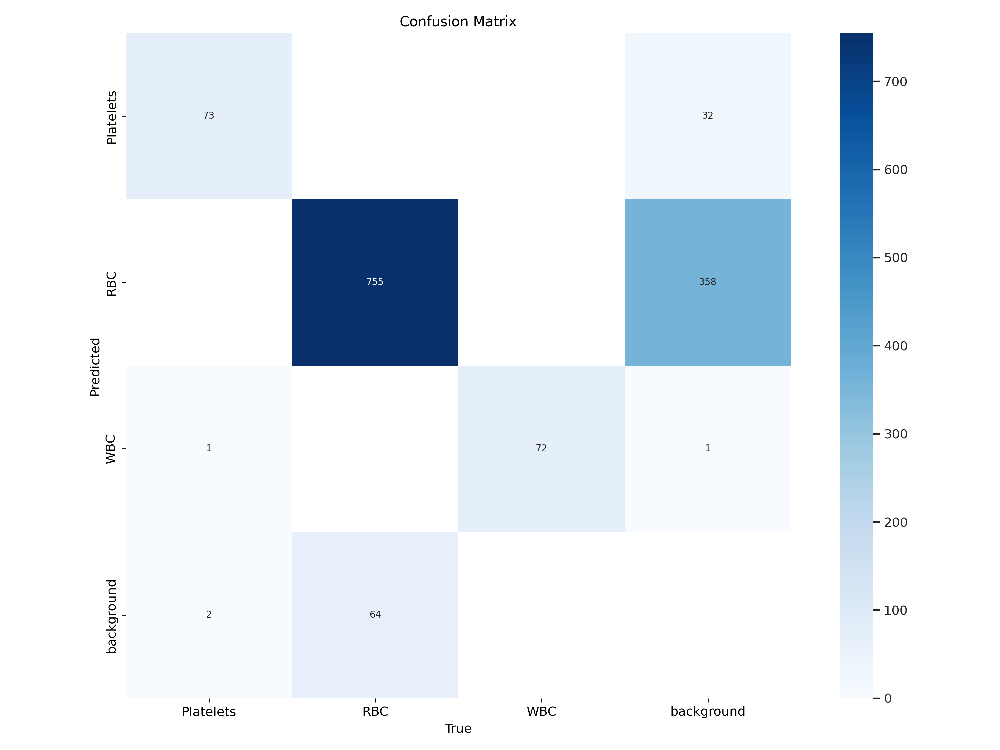

In [16]:
Image.open(f"runs/detect/train/confusion_matrix.png")

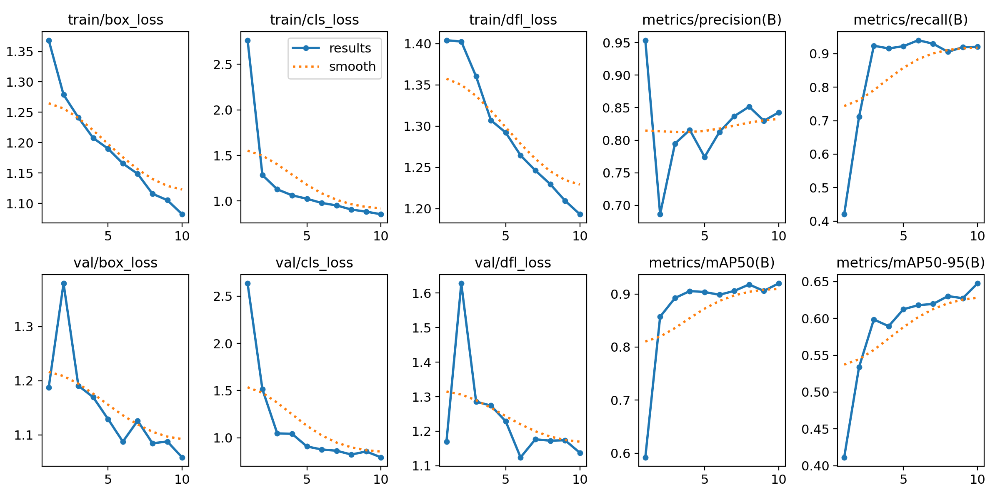

In [17]:
Image.open(f"runs/detect/train/results.png")

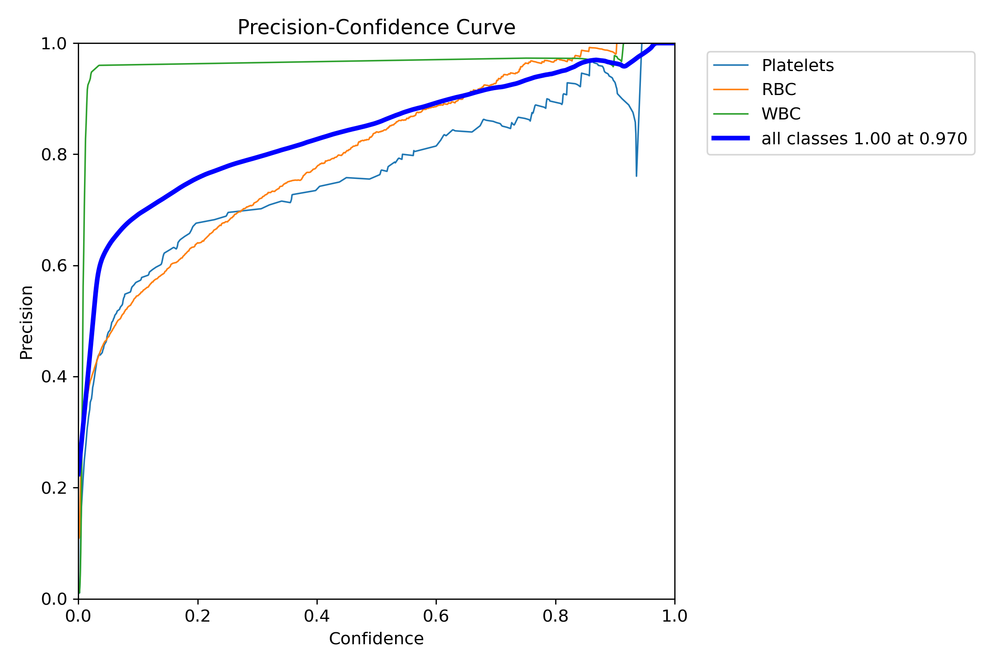

In [18]:
Image.open(f"runs/detect/train/P_curve.png")

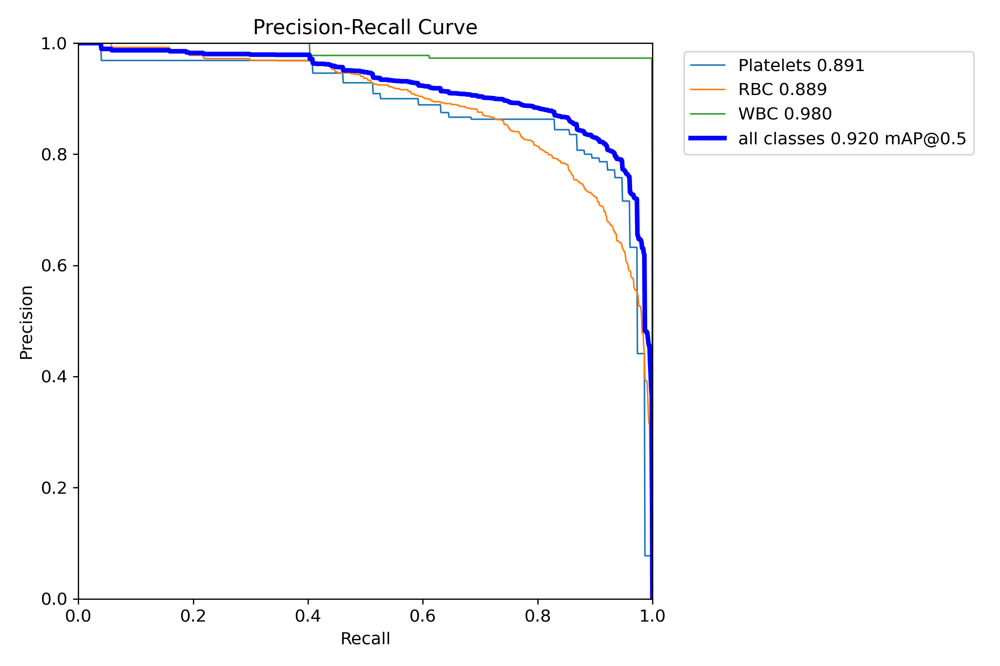

In [19]:
Image.open(f"runs/detect/train/PR_curve.png")

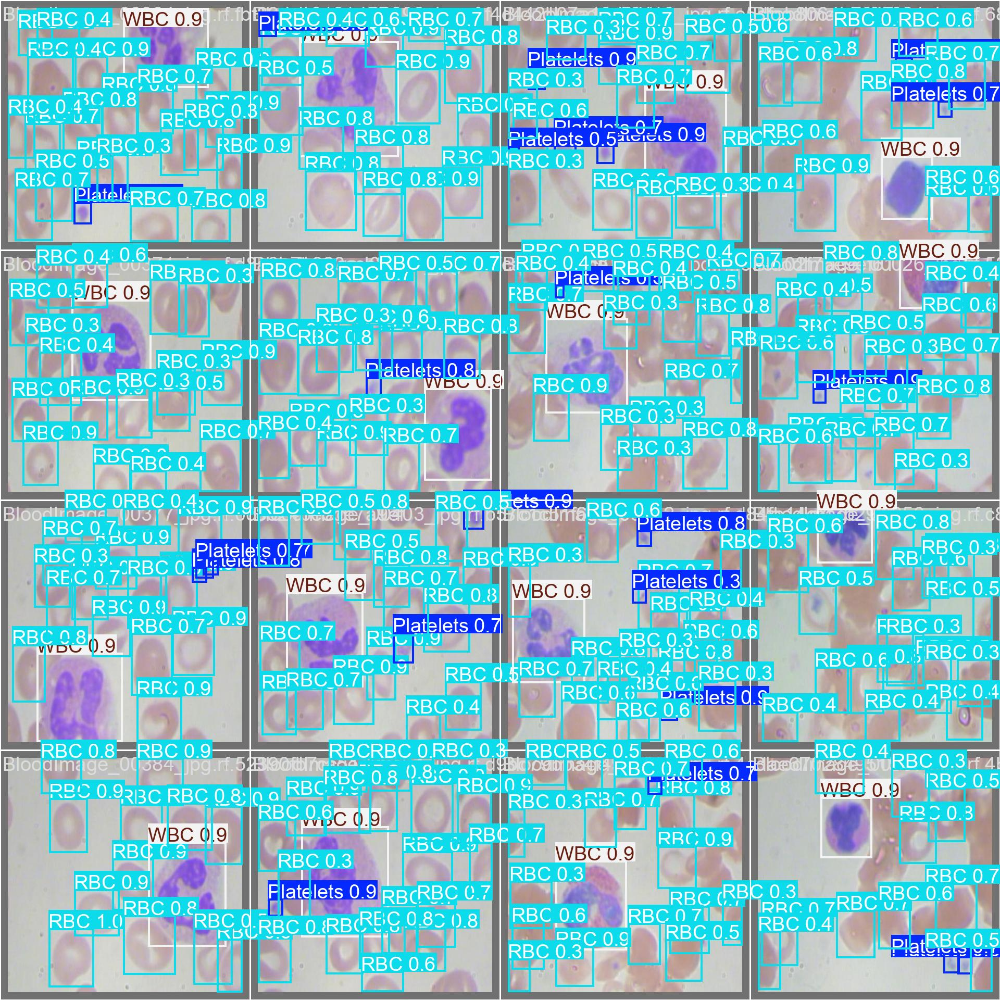

In [20]:
Image.open(f"runs/detect/train/val_batch0_pred.jpg")

<div style='background-color: #fff7f7; border: 2px solid '>
    <font size="+2" color="blue" ><b>✅ 6. Inferencewith Test Data ✅</b></font>
</div>

In [21]:
inference_results = model(f"{adhoppin_blood_cell_detection_datatset_path}/test/images")


image 1/36 /root/.cache/kagglehub/datasets/adhoppin/blood-cell-detection-datatset/versions/1036/test/images/BloodImage_00038_jpg.rf.ffa23e4b5b55b523367f332af726eae8.jpg: 480x480 2 Plateletss, 22 RBCs, 1 WBC, 17.5ms
image 2/36 /root/.cache/kagglehub/datasets/adhoppin/blood-cell-detection-datatset/versions/1036/test/images/BloodImage_00044_jpg.rf.e7760375eba4bc20c5746367e2311e18.jpg: 480x480 3 Plateletss, 22 RBCs, 2 WBCs, 10.8ms
image 3/36 /root/.cache/kagglehub/datasets/adhoppin/blood-cell-detection-datatset/versions/1036/test/images/BloodImage_00062_jpg.rf.1be1ca0ecdf783798fc10346baaa203e.jpg: 480x480 3 Plateletss, 15 RBCs, 1 WBC, 11.4ms
image 4/36 /root/.cache/kagglehub/datasets/adhoppin/blood-cell-detection-datatset/versions/1036/test/images/BloodImage_00090_jpg.rf.cdbf8f6ed3b93fa902a0bc991132cb40.jpg: 480x480 4 Plateletss, 18 RBCs, 1 WBC, 10.7ms
image 5/36 /root/.cache/kagglehub/datasets/adhoppin/blood-cell-detection-datatset/versions/1036/test/images/BloodImage_00099_jpg.rf.e3c42c

Image#1


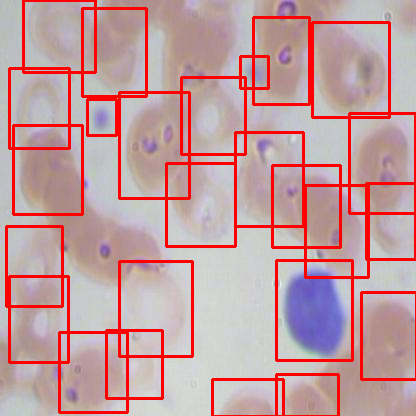

Image#2


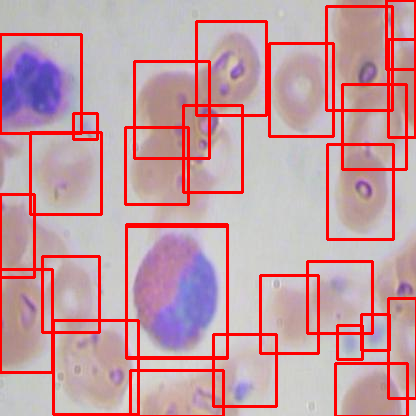

Image#3


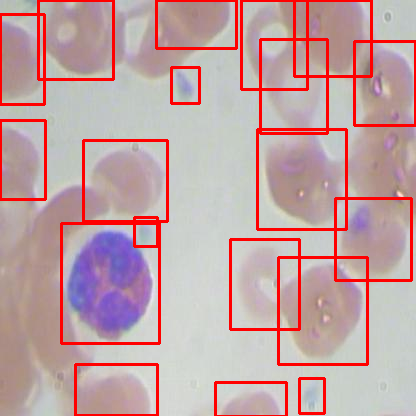

Image#4


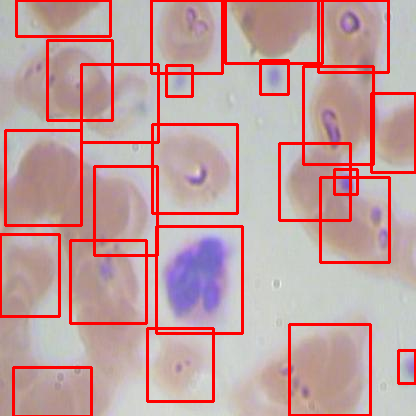

Image#5


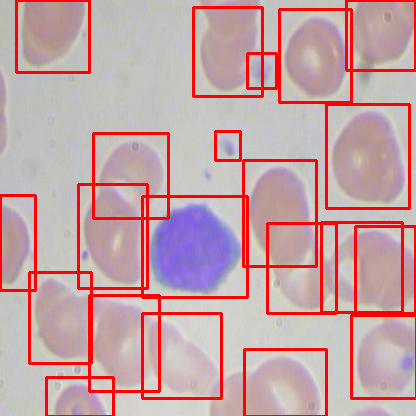

In [22]:
for idx, r in enumerate(inference_results):
    or_im_rgb = np.array(Image.open(r[0].path).convert("RGB"))
    if idx == 5: break
    print(f"Image#{idx + 1}")
    for i in r:
        for bbox in i.boxes:
            box = bbox.xyxy[0]
            x1, y1, x2, y2 = box
            coord1, coord2 = (int(x1), int(y1)), (int(x2), int(y2))
            cv2.rectangle(or_im_rgb, coord1, coord2, color=(255,0,0), thickness=2)
    display(Image.fromarray(or_im_rgb))